## CS 445: Computational Photography

## Programming Project #3: Gradient Domain Fusion

In [130]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import os
from random import random
import time
import scipy as sc
import scipy.sparse.linalg

import utils
from utils import specify_mask, get_mask, specify_bottom_center, align_source

In [27]:
import scipy.sparse as sparse
import scipy.sparse.linalg as linalg
import pyamg

## Part 1 Toy Problem (20 pts)

In [14]:
def toy_reconstruct(img):
    """
    The implementation for gradient domain processing is not complicated, but it is easy to make a mistake, so let's start with a toy example. Reconstruct this image from its gradient values, plus one pixel intensity. Denote the intensity of the source image at (x, y) as s(x,y) and the value to solve for as v(x,y). For each pixel, then, we have two objectives:
    1. minimize (v(x+1,y)-v(x,y) - (s(x+1,y)-s(x,y)))^2
    2. minimize (v(x,y+1)-v(x,y) - (s(x,y+1)-s(x,y)))^2
    Note that these could be solved while adding any constant value to v, so we will add one more objective:
    3. minimize (v(1,1)-s(1,1))^2
    
    :param toy_img: numpy.ndarray
    """
    
    im_out = np.zeros((img.shape),dtype='double')
    
    im_h, im_w, _ = img.shape
    im2var = np.arange(im_h * im_w).reshape(im_w, im_h).T
    
    M = im_h*(im_w-1) + (im_h-1)*im_w + 1
    N = im_h*im_w
    
    A = sc.sparse.lil_matrix((M,N))
    b = np.zeros((M,3))
    
    e = -1
    
    for i in range(im_h-1):
        for j in range(im_w):
            e += 1
            if j != im_w-1:
                A[e,int(im2var[i,j+1])] = 1
                A[e,int(im2var[i,j])] = -1
                b[e] = img[i,j+1] - img[i,j]
            else:
                A[e,int(im2var[i,j])] = -1
                b[e] = -img[i,j]
    for j in range(im_w-1):
        for i in range(im_h):
            e += 1
            if i != im_h-1:
                A[e,int(im2var[i+1,j])]= 1
                A[e,int(im2var[i,j])]= -1
                b[e] = img[i+1,j] - img[i,j]
            else:
                A[e,int(im2var[i,j])]= -1
                b[e] = -img[i,j]
    e += 1
    A[e,int(im2var[im_h-1,im_w-1])] = -1 
    b[e] = -img[im_h-1,im_w-1]
    
    A = sc.sparse.csr_matrix(A)
    v = np.zeros((N,3))
    v[:,0] = sc.sparse.linalg.lsqr(A, b[:,0],atol=1e-14, btol=1e-14)[0]
    v[:,1] = sc.sparse.linalg.lsqr(A, b[:,1],atol=1e-14, btol=1e-14)[0]
    v[:,2] = sc.sparse.linalg.lsqr(A, b[:,2],atol=1e-14, btol=1e-14)[0]
    for i in range(im_h):
        for j in range(im_w):
            im_out[i,j,:] = v[im2var[i,j],:]
    return im_out


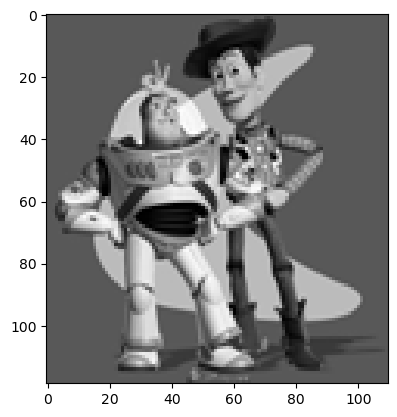

In [12]:
toy_img = cv2.cvtColor(cv2.imread('D:/1 FA2022/0CS445/MP3/samples/toy_problem.png'), cv2.COLOR_BGR2RGB).astype('double') / 255.0
plt.imshow(toy_img)
plt.show(block=True)

done


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


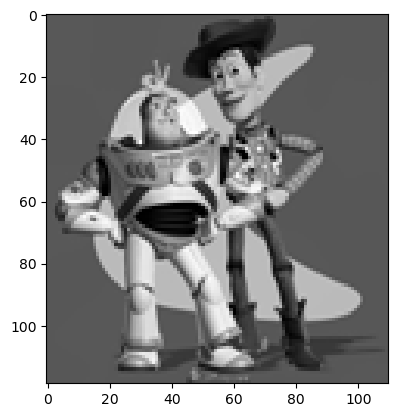

Max error is:  4.840405853911989e-12


In [15]:
im_out = toy_reconstruct(toy_img)
plt.imshow(im_out, cmap="gray")
plt.show()
print("Max error is: ", np.sqrt(((im_out - toy_img)**2).max()))

## Preparation

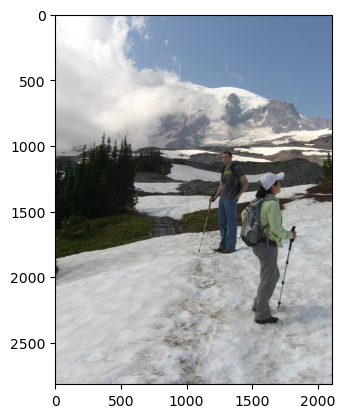

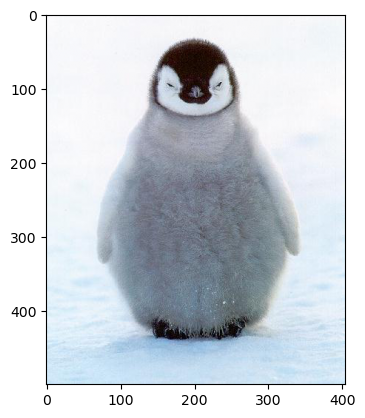

In [107]:
background_img = cv2.cvtColor(cv2.imread('D:/1 FA2022/0CS445/MP3/samples/im2.JPG'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
plt.figure()
plt.imshow(background_img)
plt.show()
object_img = cv2.cvtColor(cv2.imread('D:/1 FA2022/0CS445/MP3/samples/penguin-chick.jpeg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
plt.imshow(object_img)
plt.show()

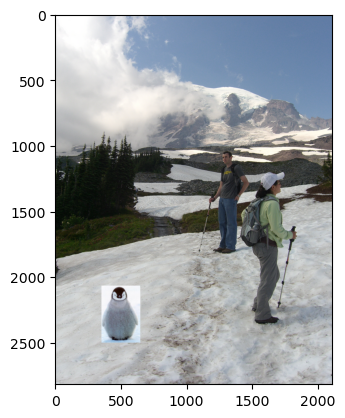

In [108]:
use_interface = False  # set to true if you want to use the interface to choose points (might not work in Colab)
if not use_interface:
  xs = (65, 359, 359, 65)
  ys = (24, 24, 457, 457)
  object_mask = utils.get_mask(ys, xs, object_img)
  bottom_center = (500, 2500) # (x,y)

  object_img, object_mask = utils.crop_object_img(object_img, object_mask)
  
  bg_ul = utils.upper_left_background_rc(object_mask, bottom_center)
  plt.imshow(utils.get_combined_img(background_img, object_img, object_mask, bg_ul))


Since the interaction is not available, I make the mask sperately in another file

In [18]:
if use_interface:
  '''
  %matplotlib notebook
  import matplotlib
  matplotlib.use('Qt5Agg')
  import matplotlib.pyplot as plt
  '''
  %matplotlib notebook
  import matplotlib.pyplot as plt
  mask_coords = specify_mask(object_img)

If it doesn't get you to the drawing mode, then rerun this function again.


<IPython.core.display.Javascript object>

In [9]:
if use_interface:
  xs = mask_coords[0]
  ys = mask_coords[1]
  %matplotlib inline
  import matplotlib.pyplot as plt
  plt.figure()
  object_mask = get_mask(ys, xs, object_img)

In [10]:
if use_interface:
  %matplotlib notebook
  import matplotlib.pyplot as plt
  bottom_center = specify_bottom_center(background_img)
 


In [11]:
if use_interface:  
  %matplotlib inline
  import matplotlib.pyplot as plt

  object_img, object_mask = utils.crop_object_img(object_img, object_mask)
  bg_ul = utils.upper_left_background_rc(object_mask, bottom_center)
  plt.imshow(utils.get_combined_img(background_img, object_img, object_mask, bg_ul))
  
  cropped_object, object_mask = align_source(object_img, mask, background_img, bottom_center)

## Part 2 Poisson Blending (50 pts)

#### general


In [146]:
def poisson_blend(object_img, object_mask, bg_img, bg_ul):
    """
    Returns a Poisson blended image with masked object_img over the bg_img at position specified by bg_ul.
    Can be implemented to operate on a single channel or multiple channels
    :param object_img: the image containing the foreground object
    :param object_mask: the mask of the foreground object in object_img
    :param background_img: the background image 
    :param bg_ul: position (row, col) in background image corresponding to (0,0) of object_img 
    """
    object_mask[object_mask==0] = False
    object_mask[object_mask!=False] = True
    object_mask = object_mask.astype(np.bool)
    
    object_size = (object_img.shape[0], object_img.shape[1])

    A = sparse.identity(np.prod(object_size), format='lil')
    for y in range(object_size[0]):
        for x in range(object_size[1]):
            if object_mask[y,x]:
                i = x + y * object_size[1]
                A[i, i] = 4
                if i + 1 < np.prod(object_size):
                    A[i, i + 1] = -1
                if i - 1 >= 0:
                    A[i, i - 1] = -1
                if i + object_size[1] < np.prod(object_size):
                    A[i, i + object_size[1]] = -1
                if i - object_size[1] >= 0:
                    A[i, i - object_size[1]] = -1
    A = A.tocsr()

    P = pyamg.gallery.poisson(object_mask.shape)
    
    pixels = np.where(np.invert(object_mask).flatten())[0]
        
    bg_img_coordinates = (
        bg_ul[0], 
        bg_ul[1],
        object_img.shape[0] + bg_ul[0],
        object_img.shape[1] + bg_ul[1])

    for c in range(bg_img.shape[2]):

        t = bg_img[bg_img_coordinates[0]:bg_img_coordinates[2],
                           bg_img_coordinates[1]:bg_img_coordinates[3],
                           c].flatten()
        
        # Generate b
        b = P * object_img[:, :, c].flatten()
        b[pixels] = t[pixels]

        # solve Ax = b
        x = sparse.linalg.spsolve(A, b)

        x = np.reshape(x, object_size)
        x = np.clip(x, 0, 255)
        x = np.array(x, bg_img.dtype)
        
        if np.issubdtype(bg_img.dtype, np.uint8):
            x[x>255] = 255
            x[x<0] = 0
        else:
            x[x>1] = 1
            x[x<0] = 0

        bg_img[bg_img_coordinates[0]:bg_img_coordinates[2],
                       bg_img_coordinates[1]:bg_img_coordinates[3],
                       c] = x

    return bg_img



In [147]:
def mask_polish(mask, k=13, t=8):
    
    mask = cv2.GaussianBlur(mask, (k, k), t, cv2.BORDER_REFLECT)
    
    for i in range(mask.shape[0]):
        for j in range(mask.shape[1]):
            if not mask[i][j][0] == 255:
                mask[i][j] = 0
            else:
                mask[i][j] = 255

    mask = cv2.cvtColor(mask, cv2.COLOR_RGB2GRAY)
    
    return mask

#### sample1

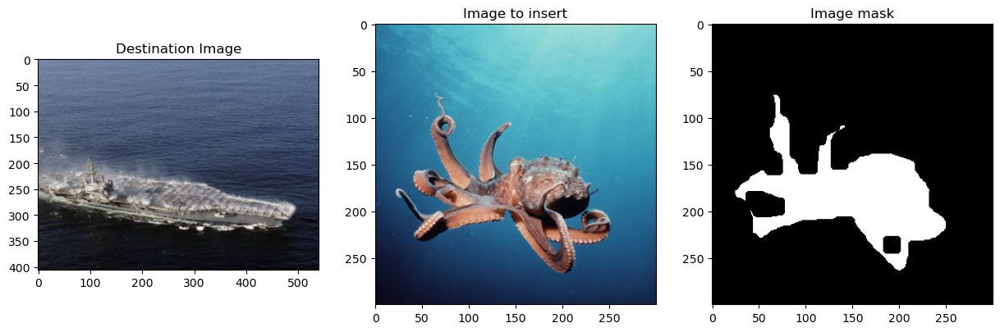

C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_17340\1244658437.py:12: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  object_mask = object_mask.astype(np.bool)


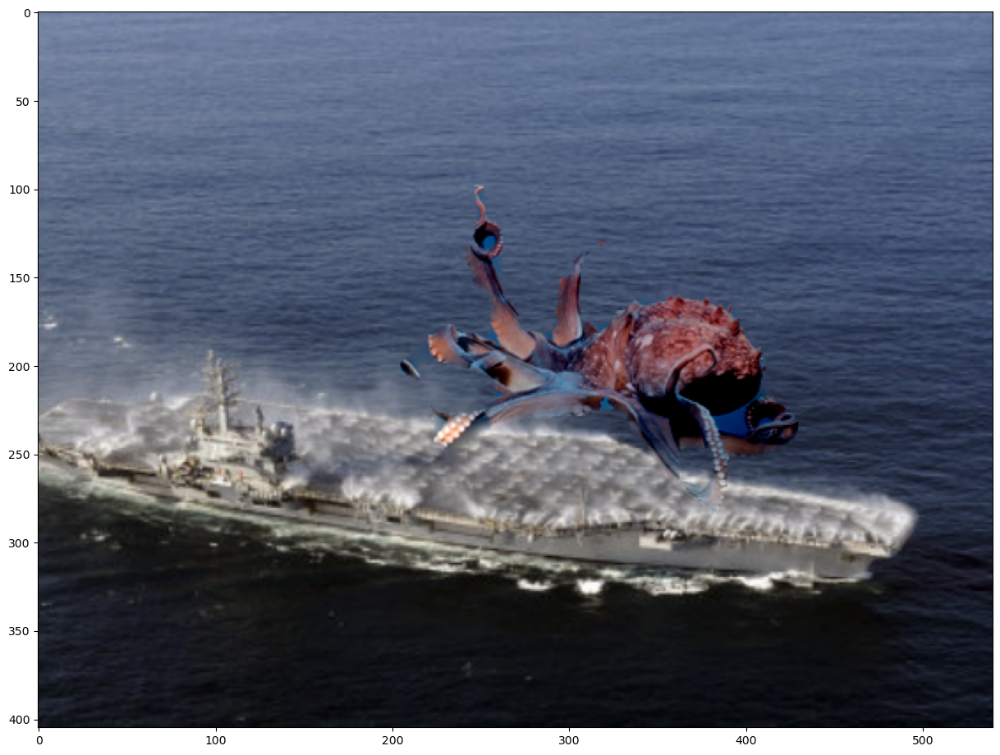

<Figure size 640x480 with 0 Axes>

In [151]:
insert = cv2.cvtColor(cv2.imread('D:/1 FA2022/0CS445/MP3/samples/source_04.jpg'), cv2.COLOR_BGR2RGB)
mask = cv2.cvtColor(cv2.imread('D:/1 FA2022/0CS445/MP3/samples/mask_04.jpg'), cv2.COLOR_BGR2RGB)
target = cv2.cvtColor(cv2.imread('D:/1 FA2022/0CS445/MP3/samples/target_04.jpg'), cv2.COLOR_BGR2RGB)

target = cv2.resize(target,(540, 405))
mask = mask_polish(mask)

# Display the precursor images
fig, axes = plt.subplots(1,3, figsize = (15,15))
axes[0].set_title('Destination Image')
axes[0].imshow(target)
axes[1].set_title('Image to insert')
axes[1].imshow(insert)
axes[2].set_title('Image mask')
axes[2].imshow(mask, cmap="gray")
plt.show()

blend = poisson_blend(insert/255.0, mask/255.0, target/255.0, (20, 180))

plt.figure(figsize = (15,15))
plt.imshow(blend)
plt.show()


#### sample2

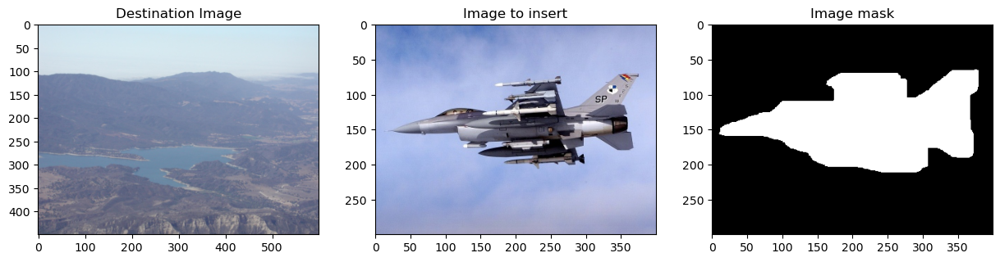

C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_17340\1418016602.py:19: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  object_mask = object_mask.astype(np.bool)


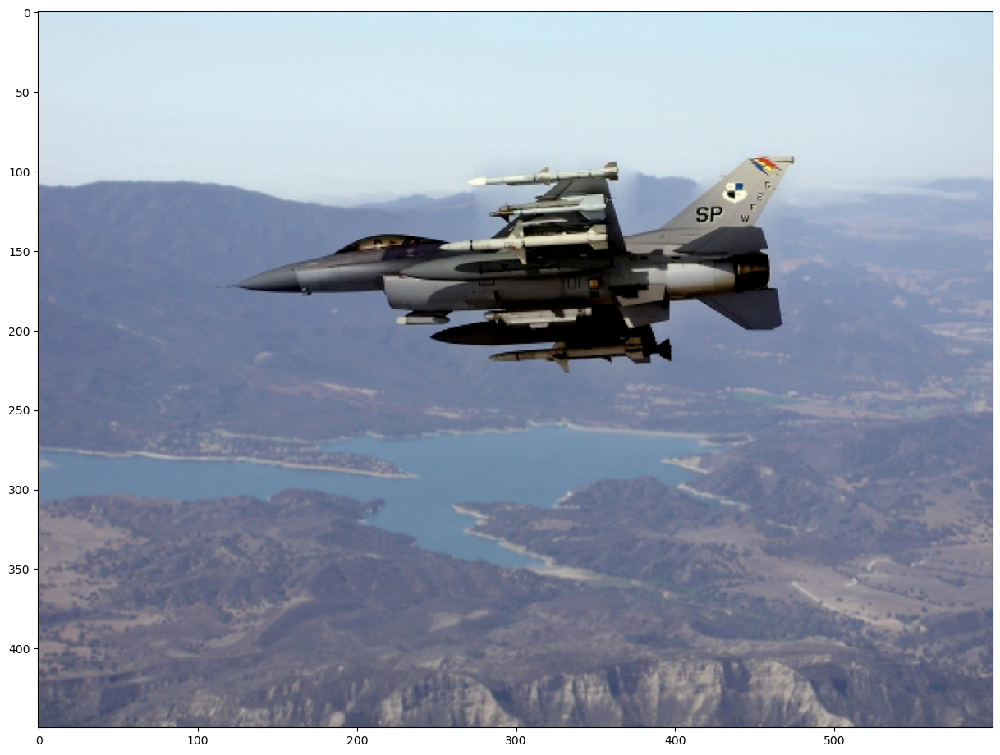

In [80]:
insert = cv2.cvtColor(cv2.imread('D:/1 FA2022/0CS445/MP3/samples/source_05.jpg'), cv2.COLOR_BGR2RGB)
mask = cv2.cvtColor(cv2.imread('D:/1 FA2022/0CS445/MP3/samples/mask_05.jpg'), cv2.COLOR_BGR2RGB)
target = cv2.cvtColor(cv2.imread('D:/1 FA2022/0CS445/MP3/samples/target_05.jpg'), cv2.COLOR_BGR2RGB)

target = cv2.resize(target,(600, 450))
mask = mask_polish(mask)

# Display the precursor images
fig, axes = plt.subplots(1,3, figsize = (15,15))
axes[0].set_title('Destination Image')
axes[0].imshow(target)
axes[1].set_title('Image to insert')
axes[1].imshow(insert)
axes[2].set_title('Image mask')
axes[2].imshow(mask, cmap="gray")
plt.show()

blend = poisson_blend(insert/255.0, mask/255.0, target/255.0, (20, 100))

plt.figure(figsize = (15,15))
plt.imshow(blend)
plt.savefig("P_2")
plt.show()

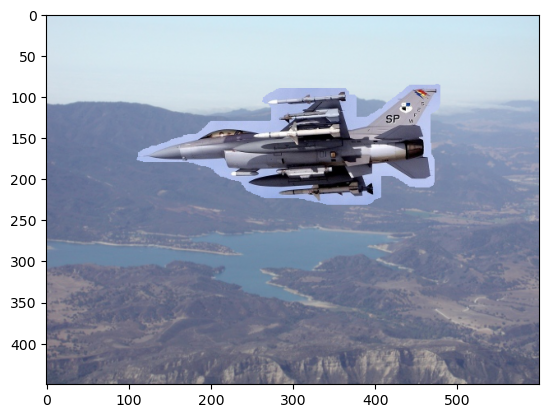

In [131]:
insert = cv2.cvtColor(cv2.imread('D:/1 FA2022/0CS445/MP3/samples/source_05.jpg'), cv2.COLOR_BGR2RGB)
mask = cv2.cvtColor(cv2.imread('D:/1 FA2022/0CS445/MP3/samples/mask_05.jpg'), cv2.COLOR_BGR2RGB)
target = cv2.cvtColor(cv2.imread('D:/1 FA2022/0CS445/MP3/samples/target_05.jpg'), cv2.COLOR_BGR2RGB)

target = cv2.resize(target,(600, 450))
mask = mask_polish(mask)

plt.imshow(utils.get_combined_img(target/255.0, insert/255.0, mask/255.0, (20, 100)))

#### sample3: failure

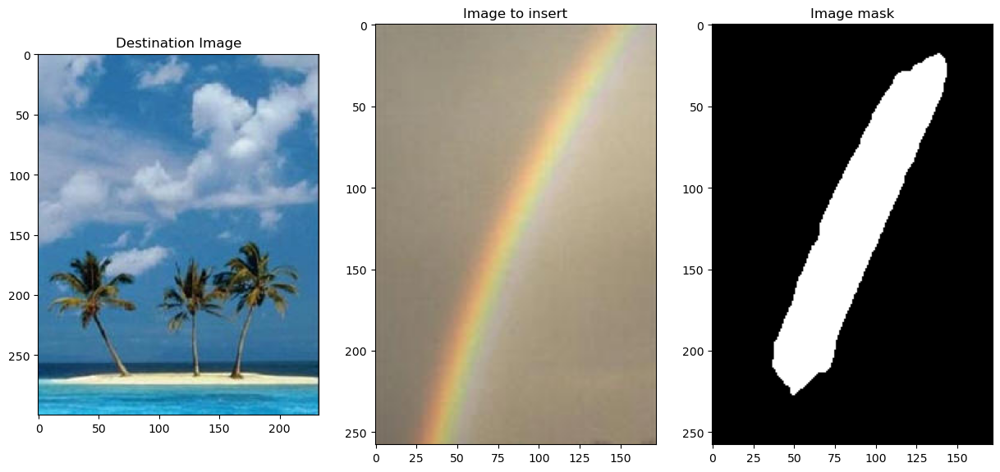

C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_17340\1418016602.py:19: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  object_mask = object_mask.astype(np.bool)


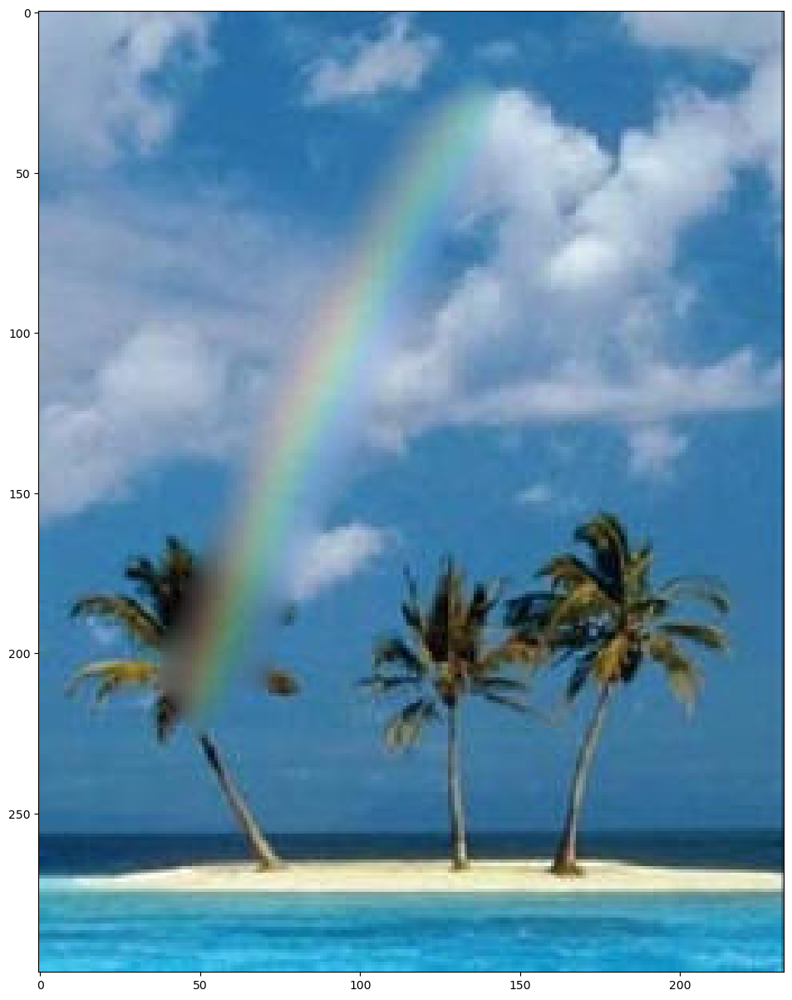

In [69]:
insert = cv2.cvtColor(cv2.imread('D:/1 FA2022/0CS445/MP3/samples/source_06.jpg'), cv2.COLOR_BGR2RGB)
mask = cv2.cvtColor(cv2.imread('D:/1 FA2022/0CS445/MP3/samples/mask_06.jpg'), cv2.COLOR_BGR2RGB)
target = cv2.cvtColor(cv2.imread('D:/1 FA2022/0CS445/MP3/samples/target_06.jpg'), cv2.COLOR_BGR2RGB)

mask = mask_polish(mask)

fig, axes = plt.subplots(1,3, figsize = (15,15))
axes[0].set_title('Destination Image')
axes[0].imshow(target)
axes[1].set_title('Image to insert')
axes[1].imshow(insert)
axes[2].set_title('Image mask')
axes[2].imshow(mask, cmap="gray")
plt.show()

blend = poisson_blend(insert/255.0, mask/255.0, target/255.0, (0, 0))

plt.figure(figsize = (15,15))
plt.imshow(blend)
plt.show()

## Part 3 Mixed Gradients (20 pts)

In [71]:
def mixed_blend(object_img, object_mask, bg_img, bg_ul):
    """
    Returns a mixed gradient blended image with masked object_img over the bg_img at position specified by bg_ul.
    Can be implemented to operate on a single channel or multiple channels
    :param object_img: the image containing the foreground object
    :param object_mask: the mask of the foreground object in object_img
    :param background_img: the background image 
    :param bg_ul: position (row, col) in background image corresponding to (0,0) of object_img 
    """
    return cv2.seamlessClone(
        object_img,
        bg_img,
        object_mask, (int(object_img.shape[1]/2) + bg_ul[1], int(object_img.shape[0]/2) + bg_ul[0]),
        cv2.MIXED_CLONE)


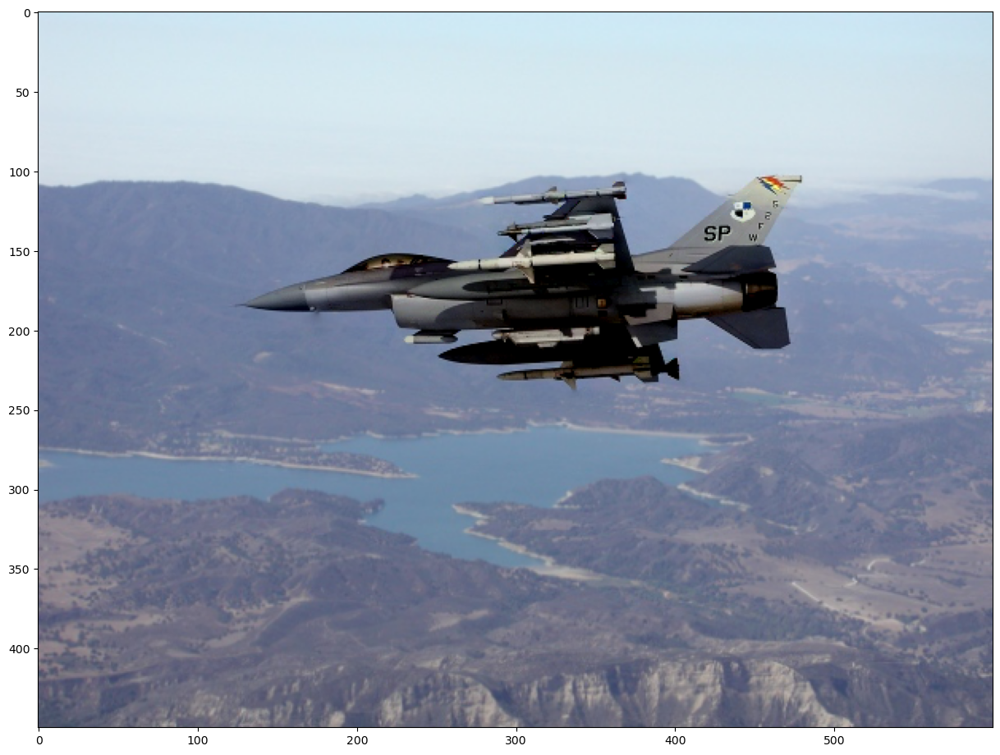

"\nfig, axes = plt.subplots(1,2, figsize = (20,20))\naxes[0].set_title('Poisson Blend')\naxes[0].imshow(life_on_mars)\naxes[1].set_title('Mixed Blend')\naxes[1].imshow(life_on_mars_mixed)\nplt.show()\n"

In [79]:
insert = cv2.cvtColor(cv2.imread('D:/1 FA2022/0CS445/MP3/samples/source_05.jpg'), cv2.COLOR_BGR2RGB)
mask = cv2.cvtColor(cv2.imread('D:/1 FA2022/0CS445/MP3/samples/mask_05.jpg'), cv2.COLOR_BGR2RGB)
target = cv2.cvtColor(cv2.imread('D:/1 FA2022/0CS445/MP3/samples/target_05.jpg'), cv2.COLOR_BGR2RGB)

target = cv2.resize(target,(600, 450))
mask = mask_polish(mask)
blend_mixed = mixed_blend(insert, mask, target, (20,100))

# Display the result
plt.figure(figsize = (15,15))
plt.imshow(blend_mixed)
plt.savefig("mixed")
plt.show()


# Bells & Whistles (Extra Points)

## Color2Gray (20 pts)

In [ ]:
def color2gray(img):
    pass

## Laplacian pyramid blending (20 pts)

In [154]:
def gaussian_pyr_maker(im, levels):
    l = im.copy()
    p = [l]
    for i in range(levels):
        l = cv2.pyrDown(l)
        p.append(l)
    return p
def laplacian_pyr_maker(gaussian):
    t = gaussian[-1]
    p = [t] 
    for i in range(len(gaussian) - 1, 0, -1):
        size = (gaussian[i - 1].shape[1], gaussian[i - 1].shape[0])
        gaussian_expanded = cv2.pyrUp(gaussian[i], dstsize=size)
        laplacian = np.subtract(gaussian[i - 1], gaussian_expanded)
        p.append(laplacian)
    return p

In [155]:
def laplacian_blend(img1, img2, mask):
    #levels
    levels = 8

    #Gaussian pyramids for source images
    gaussian_img1 = gaussian_pyr_maker(img1, levels)
    gaussian_img2 = gaussian_pyr_maker(img2, levels)
    gaussian_mask = gaussian_pyr_maker(mask, levels)
    
    #Laplacian pyramids for source images
    laplacian_img1 = laplacian_pyr_maker(gaussian_img1)
    laplacian_img2 = laplacian_pyr_maker(gaussian_img2)
    
    LS = []
    gaussian_mask.reverse()
    for la,lb,m in zip(laplacian_img1,laplacian_img2,gaussian_mask):
        ls = lb * m + la * (1.0 - m)
        LS.append(ls)

    t = LS[0]
    l = [t]

    for i in range(len(LS) - 1):
        size = (LS[i + 1].shape[1], LS[i + 1].shape[0])
        laplacian_expanded = cv2.pyrUp(t, dstsize=size)
        t = cv2.add(LS[i + 1], laplacian_expanded)
        l.append(t)

    im = l[levels]
    
    # Clip high & low values
    if np.issubdtype(im.dtype, np.uint8):
            im[im>255] = 255
            im[im<0] = 0
    else:
            im[im>1] = 1
            im[im<0] = 0

    return im


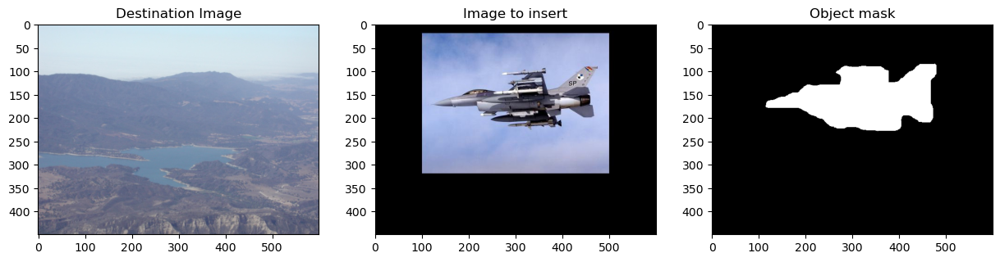

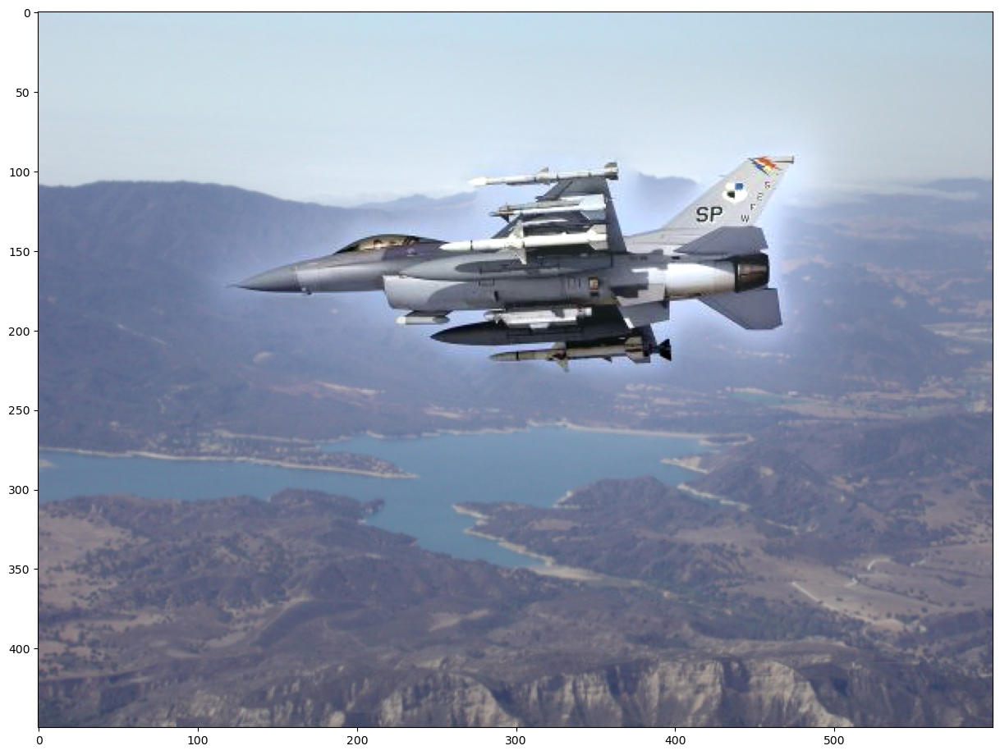

In [156]:
img2 = cv2.cvtColor(cv2.imread('D:/1 FA2022/0CS445/MP3/samples/new_source2.jpg'), cv2.COLOR_BGR2RGB)
mask = cv2.cvtColor(cv2.imread('D:/1 FA2022/0CS445/MP3/samples/new_mask2.jpg'), cv2.COLOR_BGR2RGB)
img1 = cv2.cvtColor(cv2.imread('D:/1 FA2022/0CS445/MP3/samples/target_05.jpg'), cv2.COLOR_BGR2RGB)
img1 = cv2.resize(img1,(600, 450))

mask = cv2.GaussianBlur(mask, (13, 13), 8, cv2.BORDER_REFLECT)
shape = mask.shape
for i in range(shape[0]):
    for j in range(shape[1]):
        if not mask[i][j][0] == 255:
            mask[i][j] = 0
        else:
            mask[i][j] = 255

fig, axes = plt.subplots(1,3, figsize = (15,15))
axes[0].set_title('Destination Image')
axes[0].imshow(img1)
axes[1].set_title('Image to insert')
axes[1].imshow(img2)
axes[2].set_title('Object mask')
axes[2].imshow(mask, cmap="gray")
plt.show()

final = laplacian_blend(img1/255.0, img2/255.0, mask/255.0)

plt.figure(figsize = (15,15))
plt.imshow(final)
plt.savefig("lyb.jpg")
plt.show()

## More gradient domain processing (up to 20 pts)

### edge enhancement
https://www.greenqueen.com.hk/%E2%80%8Btree-therapy-forest-bathing/

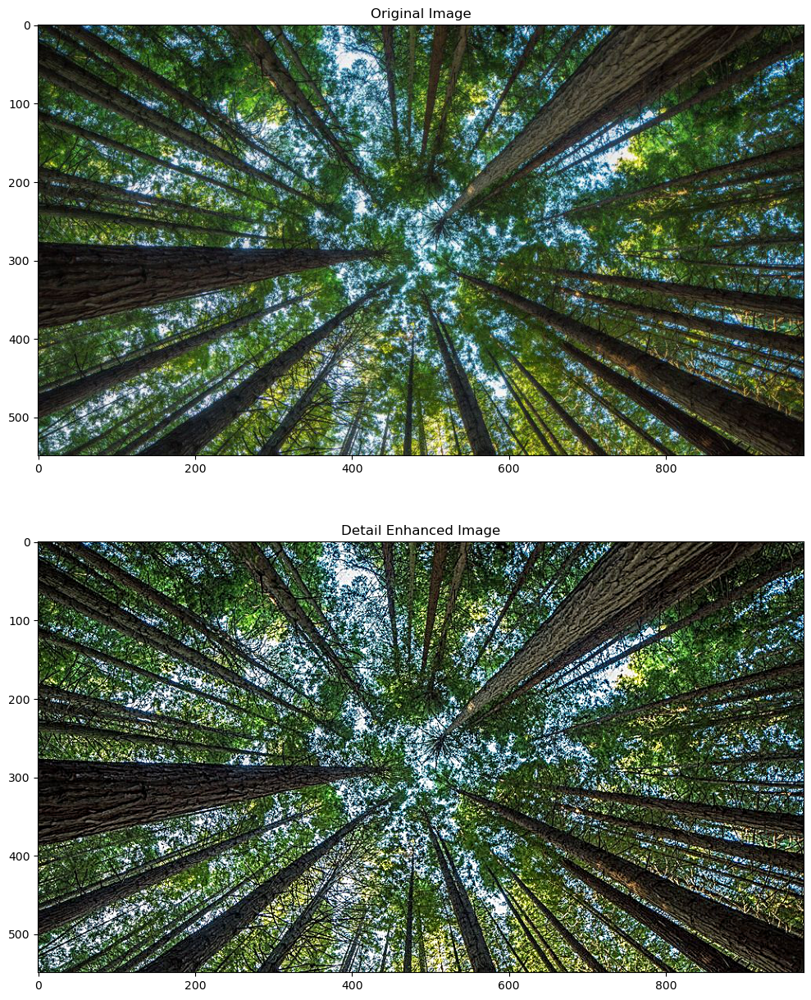

In [102]:
tree = cv2.cvtColor(cv2.imread('D:/1 FA2022/0CS445/MP3/samples/edge_enhancement.jpg'), cv2.COLOR_BGR2RGB)
tree_enhance = cv2.detailEnhance(tree, sigma_s=2, sigma_r=0.75)

fig, axes = plt.subplots(2,1, figsize = (15,15))
axes[0].set_title('Original Image')
axes[0].imshow(tree)
axes[1].set_title('Detail Enhanced Image')
axes[1].imshow(tree_enhance)
plt.show()

### non-photorealistic rendering

#### stylization
https://www.pinterest.com/pin/1143632899095947188/

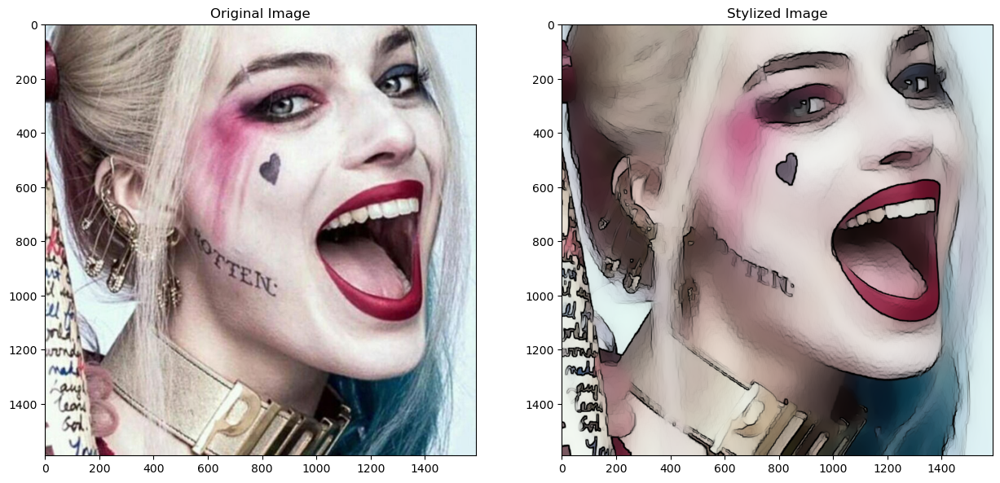

In [98]:
Harley = cv2.cvtColor(cv2.imread('D:/1 FA2022/0CS445/MP3/samples/s2.jpg'), cv2.COLOR_BGR2RGB)

Harley_sty = cv2.stylization(Harley, sigma_s=60, sigma_r=0.8)

fig, axes = plt.subplots(1,2, figsize = (15,15))
axes[0].set_title('Original Image')
axes[0].imshow(Harley)
axes[1].set_title('Stylized Image')
axes[1].imshow(Harley_sty)
plt.show()


#### edge preserving
https://digital-photography-school.com/taking-portraits-of-elderly-clients-part-2-lighting-and-posing/

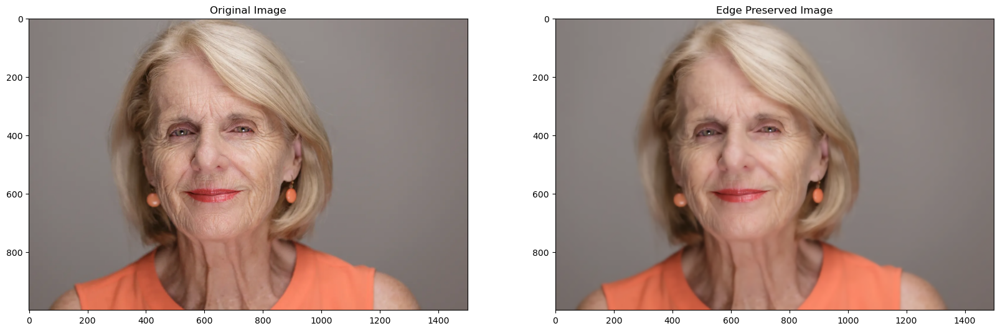

In [101]:
woman = cv2.cvtColor(cv2.imread('D:/1 FA2022/0CS445/MP3/samples/e_p2.jpg'), cv2.COLOR_BGR2RGB)

woman_younger = cv2.edgePreservingFilter(woman, flags=1, sigma_s=4, sigma_r=0.52)

fig, axes = plt.subplots(1,2, figsize = (20,20))
axes[0].set_title('Original Image')
axes[0].imshow(woman)
axes[1].set_title('Edge Preserved Image')
axes[1].imshow(woman_younger)
plt.show()